
# Nerfstudio Lab


![image.jpg](markdown_assests/logo.png)

**NeRFstudio** es una plataforma de código abierto diseñada para la investigación y desarrollo de modelos basados en *Neural Radiance Fields* (NeRFs). Los NeRFs son una técnica avanzada de representación de escenas 3D que utiliza redes neuronales profundas para modelar cómo la luz interactúa con los objetos en un entorno tridimensional. Esta técnica permite la creación de modelos 3D detallados y fotorealistas a partir de conjuntos de datos 2D, como imágenes o secuencias de vídeo. NeRFstudio proporciona herramientas y recursos para entrenar, evaluar y visualizar modelos NeRF de manera eficiente, facilitando el flujo de trabajo para investigadores y desarrolladores interesados en esta tecnología.

La plataforma ofrece una interfaz amigable y una serie de configuraciones predefinidas que permiten a los usuarios experimentar con diferentes arquitecturas y métodos de entrenamiento de NeRF. Además, NeRFstudio incluye documentación detallada y ejemplos que cubren desde la instalación y configuración inicial hasta la implementación de experimentos personalizados. Esto la convierte en una herramienta poderosa no solo para el desarrollo de proyectos de investigación, sino también para aplicaciones prácticas en áreas como la reconstrucción 3D, la realidad aumentada y la síntesis de imágenes.

Primero ingresa tu código uniandes:

In [1]:
codigo = 202422619

Ahora importemos las librerías necesarias para este laboratorio

In [2]:
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from IPython.display import display
import os
import cv2
import glob
import yaml
from datetime import datetime
import numpy as np
import trimesh
from pythreejs import *
from scipy.spatial import cKDTree
import logging
import lm
import json
import random

# Creando un modelo base con datos demo

Para empezar, vamos a usar NeRFstudio con un conjunto de datos predefinido, la escena del póster. Tu tarea es determinar el comando de bash/shell que descarga este conjunto de datos.

La documentación de NeRFstudio habla sobre cómo descargar el conjunto de datos del póster cuando enseña cómo entrenar tu primer modelo: [https://docs.nerf.studio/index.html](https://docs.nerf.studio/index.html).

Para efectos de evitar fallos en el laboratorio relacionados con la conexión a internet, los datos del poster se encuentran comprimidos en el archivo data.zip, por lo tanto, en la siguiente celda:

    1. Declara la variable nerfstudio_data_download_command con el string correspondiente al comando que  descarga los datos del poster segun nerfstudio.

    2. Ejecuta el comando en bash/shell para descomprimir data.zip. Utiliza la opcion -o de unzip para sobreescribir cualquier dato ya descomprimido.

**Nota importante**:
Para correr comando de bash/shell en un notebook .ipynb, escribe la linea precedida por un sigo de exclamacion "!"
por ejemplo, para listar la carpeta en la que te encuentras, corre: !ls

In [7]:
# 1. Declara la variable incluyendo el '!' dentro del string para pasar el assert
nerfstudio_data_download_command = "!ns-download-data nerfstudio --dataset=poster"

# 2. Ejecuta el comando de descompresión (el ! va fuera porque es ejecución directa)
!unzip -o data.zip

Archive:  data.zip
  inflating: data/nerfstudio/poster/images_2/frame_00059.png  
  inflating: data/nerfstudio/poster/images_2/frame_00065.png  
  inflating: data/nerfstudio/poster/images_2/frame_00071.png  
  inflating: data/nerfstudio/poster/images_2/frame_00139.png  
  inflating: data/nerfstudio/poster/images_2/frame_00111.png  
  inflating: data/nerfstudio/poster/images_2/frame_00105.png  
  inflating: data/nerfstudio/poster/images_2/frame_00104.png  
  inflating: data/nerfstudio/poster/images_2/frame_00110.png  
  inflating: data/nerfstudio/poster/images_2/frame_00138.png  
  inflating: data/nerfstudio/poster/images_2/frame_00070.png  
  inflating: data/nerfstudio/poster/images_2/frame_00064.png  
  inflating: data/nerfstudio/poster/images_2/frame_00058.png  
  inflating: data/nerfstudio/poster/images_2/frame_00099.png  
  inflating: data/nerfstudio/poster/images_2/frame_00072.png  
  inflating: data/nerfstudio/poster/images_2/frame_00066.png  
  inflating: data/nerfstudio/poster/

  inflating: data/nerfstudio/poster/images_2/frame_00145.png  
  inflating: data/nerfstudio/poster/images_2/frame_00179.png  
  inflating: data/nerfstudio/poster/images_2/frame_00192.png  
  inflating: data/nerfstudio/poster/images_2/frame_00186.png  
  inflating: data/nerfstudio/poster/images_2/frame_00025.png  
  inflating: data/nerfstudio/poster/images_2/frame_00031.png  
  inflating: data/nerfstudio/poster/images_2/frame_00019.png  
  inflating: data/nerfstudio/poster/images_2/frame_00035.png  
  inflating: data/nerfstudio/poster/images_2/frame_00021.png  
  inflating: data/nerfstudio/poster/images_2/frame_00009.png  
  inflating: data/nerfstudio/poster/images_2/frame_00223.png  
  inflating: data/nerfstudio/poster/images_2/frame_00182.png  
  inflating: data/nerfstudio/poster/images_2/frame_00196.png  
  inflating: data/nerfstudio/poster/images_2/frame_00141.png  
  inflating: data/nerfstudio/poster/images_2/frame_00155.png  
  inflating: data/nerfstudio/poster/images_2/frame_0016

  inflating: data/nerfstudio/poster/images_4/frame_00060.png  
  inflating: data/nerfstudio/poster/images_4/frame_00074.png  
  inflating: data/nerfstudio/poster/images_4/frame_00048.png  
  inflating: data/nerfstudio/poster/images_4/frame_00114.png  
  inflating: data/nerfstudio/poster/images_4/frame_00100.png  
  inflating: data/nerfstudio/poster/images_4/frame_00128.png  
  inflating: data/nerfstudio/poster/images_4/frame_00129.png  
  inflating: data/nerfstudio/poster/images_4/frame_00101.png  
  inflating: data/nerfstudio/poster/images_4/frame_00115.png  
  inflating: data/nerfstudio/poster/images_4/frame_00049.png  
  inflating: data/nerfstudio/poster/images_4/frame_00075.png  
  inflating: data/nerfstudio/poster/images_4/frame_00061.png  
  inflating: data/nerfstudio/poster/images_4/frame_00006.png  
  inflating: data/nerfstudio/poster/images_4/frame_00012.png  
  inflating: data/nerfstudio/poster/images_4/frame_00204.png  
  inflating: data/nerfstudio/poster/images_4/frame_0021

  inflating: data/nerfstudio/poster/images_4/frame_00143.png  
  inflating: data/nerfstudio/poster/images_4/frame_00157.png  
  inflating: data/nerfstudio/poster/images_4/frame_00180.png  
  inflating: data/nerfstudio/poster/images_4/frame_00194.png  
  inflating: data/nerfstudio/poster/images_4/frame_00209.png  
  inflating: data/nerfstudio/poster/images_4/frame_00221.png  
  inflating: data/nerfstudio/poster/images_4/frame_00037.png  
  inflating: data/nerfstudio/poster/images_4/frame_00023.png  
  inflating: data/nerfstudio/poster/images_4/frame_00087.png  
  inflating: data/nerfstudio/poster/images_4/frame_00093.png  
  inflating: data/nerfstudio/poster/images_4/frame_00078.png  
  inflating: data/nerfstudio/poster/images_4/frame_00044.png  
  inflating: data/nerfstudio/poster/images_4/frame_00050.png  
  inflating: data/nerfstudio/poster/images_4/frame_00118.png  
  inflating: data/nerfstudio/poster/images_4/frame_00130.png  
  inflating: data/nerfstudio/poster/images_4/frame_0012

  inflating: data/nerfstudio/poster/images/frame_00158.png  
  inflating: data/nerfstudio/poster/images/frame_00206.png  
  inflating: data/nerfstudio/poster/images/frame_00212.png  
  inflating: data/nerfstudio/poster/images/frame_00004.png  
  inflating: data/nerfstudio/poster/images/frame_00010.png  
  inflating: data/nerfstudio/poster/images/frame_00038.png  
  inflating: data/nerfstudio/poster/images/frame_00014.png  
  inflating: data/nerfstudio/poster/images/frame_00028.png  
  inflating: data/nerfstudio/poster/images/frame_00216.png  
  inflating: data/nerfstudio/poster/images/frame_00202.png  
  inflating: data/nerfstudio/poster/images/frame_00160.png  
  inflating: data/nerfstudio/poster/images/frame_00174.png  
  inflating: data/nerfstudio/poster/images/frame_00148.png  
  inflating: data/nerfstudio/poster/images/frame_00149.png  
  inflating: data/nerfstudio/poster/images/frame_00175.png  
  inflating: data/nerfstudio/poster/images/frame_00161.png  
  inflating: data/nerfst

  inflating: data/nerfstudio/poster/images/frame_00122.png  
  inflating: data/nerfstudio/poster/images/frame_00136.png  
  inflating: data/nerfstudio/poster/images/frame_00137.png  
  inflating: data/nerfstudio/poster/images/frame_00123.png  
  inflating: data/nerfstudio/poster/images/frame_00043.png  
  inflating: data/nerfstudio/poster/images/frame_00057.png  
  inflating: data/nerfstudio/poster/images/frame_00080.png  
  inflating: data/nerfstudio/poster/images/frame_00094.png  
  inflating: data/nerfstudio/poster/images/frame_00082.png  
  inflating: data/nerfstudio/poster/images/frame_00096.png  
  inflating: data/nerfstudio/poster/images/frame_00041.png  
  inflating: data/nerfstudio/poster/images/frame_00055.png  
  inflating: data/nerfstudio/poster/images/frame_00069.png  
  inflating: data/nerfstudio/poster/images/frame_00135.png  
  inflating: data/nerfstudio/poster/images/frame_00121.png  
  inflating: data/nerfstudio/poster/images/frame_00109.png  
  inflating: data/nerfst

  inflating: data/nerfstudio/poster/images_8/frame_00016.png  
  inflating: data/nerfstudio/poster/images_8/frame_00002.png  
  inflating: data/nerfstudio/poster/images_8/frame_00027.png  
  inflating: data/nerfstudio/poster/images_8/frame_00033.png  
  inflating: data/nerfstudio/poster/images_8/frame_00219.png  
  inflating: data/nerfstudio/poster/images_8/frame_00225.png  
  inflating: data/nerfstudio/poster/images_8/frame_00190.png  
  inflating: data/nerfstudio/poster/images_8/frame_00184.png  
  inflating: data/nerfstudio/poster/images_8/frame_00153.png  
  inflating: data/nerfstudio/poster/images_8/frame_00147.png  
  inflating: data/nerfstudio/poster/images_8/frame_00146.png  
  inflating: data/nerfstudio/poster/images_8/frame_00152.png  
  inflating: data/nerfstudio/poster/images_8/frame_00185.png  
  inflating: data/nerfstudio/poster/images_8/frame_00191.png  
  inflating: data/nerfstudio/poster/images_8/frame_00224.png  
  inflating: data/nerfstudio/poster/images_8/frame_0021

### Verifica y guarda tu respuesta 1

In [8]:
assert(os.path.isdir("data/nerfstudio/poster")), 'Error al descomprimir los datos'
assert('!ns' in nerfstudio_data_download_command), 'Error en la declaración del comando'
lm.verify_and_save(1, nerfstudio_data_download_command, codigo)

Nerfstudio ofrece comandos simples con una variedad de opciones para entrenar sus modelos NeRF. En este caso, simplemente utilizaremos su modelo predeterminado `nerfacto` con la configuración por defecto en el conjunto de datos del póster.

Empecemos visualizando algunos frames de la escena del poster:

No .jpg images found in the folder. Attempting .pngs


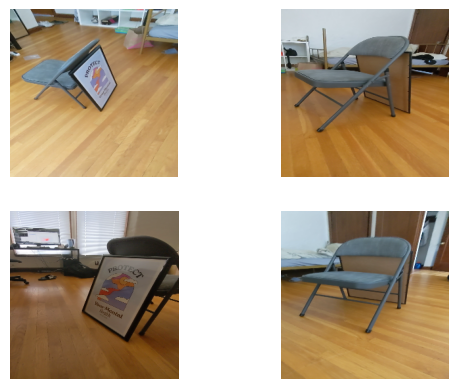

In [9]:
frames_folder = 'data/nerfstudio/poster/images_2'

def display_some_frames(frames_folder):
    images = [img for img in os.listdir(frames_folder) if img.endswith(".jpg")]
    if not images:
        print("No .jpg images found in the folder. Attempting .pngs")
        images = [img for img in os.listdir(frames_folder) if img.endswith(".png")]
        if not images:
            print("No .png images found in the folder.")
    
    
    images = images[:4]
    images = [os.path.join(frames_folder, j) for j in images]
    images = [cv2.imread(k) for k in images]
    images = [cv2.resize(l, (256, 256)) for l in images]
    fig, ((ax1, ax2),(ax3, ax4)) = plt.subplots(2, 2)
    ax = [ax1, ax2, ax3, ax4]
    for i in range(len(images)):  
        im = ax[i].imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
        ax[i].set_axis_off()

if os.path.isdir(frames_folder):
    display_some_frames(frames_folder)




Además, proveamos de forma manual el checkpoint de ALexNet para LPIPs, con el fin de evitar errores en el laboratorio

In [10]:
if not os.path.isdir("/root/.cache/torch/hub/checkpoints/"):
    %mkdir -p /root/.cache/torch/hub/checkpoints/
    
%cp alexnet-owt-7be5be79.pth /root/.cache/torch/hub/checkpoints/
%ls /root/.cache/torch/hub/checkpoints/

alexnet-owt-7be5be79.pth


## Entrenando el modelo base

En la siguiente celda, ejecuta el comando de entrenamiento correspondiente para NeRFstudio.

Para nuestro entrenamiento necesitamos especificar: 
1. El nombre del experimento sera poster
2. El visualizador será tensorboard
3. 2000 iteraciones máximas
4. El puerto websocket 7007
5. seguir el comando especificando que estamos utilizando datos de formato `nerfstudio-data`
6. apuntar a la ruta de los datos descargados
7. usar un factor de reducción de 8.

Durante el entrenamiento, al  seleccionar el valor True en el parametro dentro del viewer que hace un URL compartido, podran colocarlo en su navegador y observar interactivamente el entrenamiento del campo de radiancia neuronal. Desafortunadamente, en este entorno local de Coursera, no se va a generar el link exitosamente.

pista: La documentacion de entrenar tu primer modelo de nerfstudio puede darte la guia inicial, sin emabrgo, recuerda los parametros extra que tienes que especificar.
pista 2: la opcion !ns-train nerfacto -h puede que te sea de ayuda.

In [11]:
#Agrega el comando de entrenamiento de nerf (es un comando de bash/shell)
!ns-train nerfacto --experiment-name poster --max-num-iterations 2000 --vis tensorboard --viewer.websocket-port 7007 nerfstudio-data --data data/nerfstudio/poster --downscale-factor 8

──────────────────────────────────────────────────────── Config ────────────────────────────────────────────────────────
TrainerConfig(
    _target=<class 'nerfstudio.engine.trainer.Trainer'>,
    output_dir=PosixPath('outputs'),
    method_name='nerfacto',
    experiment_name='poster',
    project_name='nerfstudio-project',
    timestamp='2026-04-12_142353',
    machine=MachineConfig(seed=42, num_devices=1, num_machines=1, machine_rank=0, dist_url='auto', device_type='cuda'),
    logging=LoggingConfig(
        relative_log_dir=PosixPath('.'),
        steps_per_log=10,
        max_buffer_size=20,
        local_writer=LocalWriterConfig(
            _target=<class 'nerfstudio.utils.writer.LocalWriter'>,
            enable=True,
            stats_to_track=(
                <EventName.ITER_TRAIN_TIME: 'Train Iter (time)'>,
                <EventName.TRAIN_RAYS_PER_SEC: 'Train Rays / Sec'>,
                <EventName.CURR_TEST_PSNR: 'Test PSNR'>,
                <EventName.VIS_RAYS_PER_SEC:

[14:23:53] Saving config to: outputs/poster/nerfacto/2026-04-12_142353/config.yml               ]8;id=587375;file:///root/miniconda3/envs/py310/lib/python3.10/site-packages/nerfstudio/configs/experiment_config.py\experiment_config.py]8;;\:]8;id=695462;file:///root/miniconda3/envs/py310/lib/python3.10/site-packages/nerfstudio/configs/experiment_config.py#136\136]8;;\
           Saving checkpoints to: outputs/poster/nerfacto/2026-04-12_142353/nerfstudio_models             ]8;id=234053;file:///root/miniconda3/envs/py310/lib/python3.10/site-packages/nerfstudio/engine/trainer.py\trainer.py]8;;\:]8;id=146316;file:///root/miniconda3/envs/py310/lib/python3.10/site-packages/nerfstudio/engine/trainer.py#142\142]8;;\
Started threads
Setting up evaluation dataset...
Caching all 22 images.
Loading data batch ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 0:00:00
Loading data batch ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 0:00:00m 0:00:01
No Nerfstudio checkpoint to load, so trai

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec      
----------------------------------------------------------------------------------- 
10 (0.50%)          19 s, 782.222 ms     10 h, 56 m, 6 s      14.91 K               
20 (1.00%)          264.795 ms           8 m, 44 s            17.81 K               
30 (1.50%)          209.021 ms           6 m, 51 s            20.87 K               
40 (2.00%)          208.983 ms           6 m, 49 s            20.95 K               
50 (2.50%)          202.379 ms           6 m, 34 s            21.06 K               
60 (3.00%)          198.036 ms           6 m, 24 s            22.18 K               
70 (3.50%)          192.144 ms           6 m, 10 s            23.15 K               
80 (4.00%)          192.952 ms           6 m, 10 s            22.81 K               
90 (4.50%)          204.664 ms           6 m, 30 s            21.40 K               
100 (5.00%)         204.872 ms           6 m, 29 s            25.

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec      
----------------------------------------------------------------------------------- 
90 (4.50%)          204.664 ms           6 m, 30 s            21.40 K               
100 (5.00%)         204.872 ms           6 m, 29 s            25.61 K               
110 (5.50%)         202.168 ms           6 m, 22 s            25.97 K               
120 (6.00%)         210.881 ms           6 m, 36 s            20.54 K               
130 (6.50%)         216.617 ms           6 m, 45 s            20.12 K               
140 (7.00%)         221.304 ms           6 m, 51 s            19.72 K               
150 (7.50%)         217.018 ms           6 m, 41 s            21.68 K               
160 (8.00%)         201.874 ms           6 m, 11 s            23.83 K               
170 (8.50%)         216.472 ms           6 m, 36 s            22.35 K               
180 (9.00%)         215.792 ms           6 m, 32 s            21.

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec      
----------------------------------------------------------------------------------- 
170 (8.50%)         216.472 ms           6 m, 36 s            22.35 K               
180 (9.00%)         215.792 ms           6 m, 32 s            21.31 K               
190 (9.50%)         194.316 ms           5 m, 51 s            21.52 K               
200 (10.00%)        196.531 ms           5 m, 53 s            27.31 K               
210 (10.50%)        206.488 ms           6 m, 9 s             27.41 K               
220 (11.00%)        188.355 ms           5 m, 35 s            26.05 K               
230 (11.50%)        176.825 ms           5 m, 12 s            26.69 K               
240 (12.00%)        193.492 ms           5 m, 40 s            23.16 K               
250 (12.50%)        210.601 ms           6 m, 8 s             23.93 K               
260 (13.00%)        228.393 ms           6 m, 37 s            22.

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec      
----------------------------------------------------------------------------------- 
250 (12.50%)        210.601 ms           6 m, 8 s             23.93 K               
260 (13.00%)        228.393 ms           6 m, 37 s            22.17 K               
270 (13.50%)        206.336 ms           5 m, 56 s            28.02 K               
280 (14.00%)        195.662 ms           5 m, 36 s            29.46 K               
290 (14.50%)        197.721 ms           5 m, 38 s            25.09 K               
300 (15.00%)        185.777 ms           5 m, 15 s            26.96 K               
310 (15.50%)        194.686 ms           5 m, 29 s            25.49 K               
320 (16.00%)        197.284 ms           5 m, 31 s            24.89 K               
330 (16.50%)        191.090 ms           5 m, 19 s            30.58 K               
340 (17.00%)        194.611 ms           5 m, 23 s            29.

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec      
----------------------------------------------------------------------------------- 
330 (16.50%)        191.090 ms           5 m, 19 s            30.58 K               
340 (17.00%)        194.611 ms           5 m, 23 s            29.47 K               
350 (17.50%)        204.522 ms           5 m, 37 s            22.82 K               
360 (18.00%)        196.436 ms           5 m, 22 s            23.70 K               
370 (18.50%)        197.929 ms           5 m, 22 s            23.41 K               
380 (19.00%)        209.457 ms           5 m, 39 s            22.20 K               
390 (19.50%)        209.469 ms           5 m, 37 s            21.46 K               
400 (20.00%)        196.579 ms           5 m, 14 s            22.97 K               
410 (20.50%)        206.506 ms           5 m, 28 s            23.57 K               
420 (21.00%)        205.673 ms           5 m, 24 s            23.

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
410 (20.50%)        206.506 ms           5 m, 28 s            23.57 K                                    
420 (21.00%)        205.673 ms           5 m, 24 s            23.01 K                                    
430 (21.50%)        199.689 ms           5 m, 13 s            21.70 K                                    
440 (22.00%)        216.510 ms           5 m, 37 s            19.37 K                                    
450 (22.50%)        197.207 ms           5 m, 5 s             22.53 K                                    
460 (23.00%)        186.305 ms           4 m, 46 s            24.42 K                                    
470 (23.50%)        200.511 ms           5 m, 6 s             23.36 K                                    
480 (24.00%)        202.569 ms           5 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
480 (24.00%)        202.569 ms           5 m, 7 s             23.30 K                                    
490 (24.50%)        190.898 ms           4 m, 48 s            24.40 K                                    
500 (25.00%)        185.084 ms           4 m, 37 s            26.34 K              27.38 K               
510 (25.50%)        210.523 ms           5 m, 13 s            24.17 K                                    
520 (26.00%)        241.866 ms           5 m, 57 s            21.35 K                                    
530 (26.50%)        247.439 ms           6 m, 3 s             19.44 K                                    
540 (27.00%)        227.208 ms           5 m, 31 s            21.60 K                                    
550 (27.50%)        222.151 ms           5 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
550 (27.50%)        222.151 ms           5 m, 22 s            23.08 K                                    
560 (28.00%)        246.273 ms           5 m, 54 s            18.59 K                                    
570 (28.50%)        248.483 ms           5 m, 55 s            17.33 K                                    
580 (29.00%)        215.693 ms           5 m, 6 s             20.78 K                                    
590 (29.50%)        191.895 ms           4 m, 30 s            24.29 K                                    
600 (30.00%)        193.951 ms           4 m, 31 s            24.39 K                                    
610 (30.50%)        191.602 ms           4 m, 26 s            24.18 K                                    
620 (31.00%)        188.207 ms           4 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
620 (31.00%)        188.207 ms           4 m, 19 s            25.13 K                                    
630 (31.50%)        210.269 ms           4 m, 48 s            22.46 K                                    
640 (32.00%)        229.705 ms           5 m, 12 s            20.84 K                                    
650 (32.50%)        220.461 ms           4 m, 57 s            21.21 K                                    
660 (33.00%)        209.200 ms           4 m, 40 s            21.72 K                                    
670 (33.50%)        203.951 ms           4 m, 31 s            22.71 K                                    
680 (34.00%)        206.039 ms           4 m, 31 s            22.89 K                                    
690 (34.50%)        211.803 ms           4 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
690 (34.50%)        211.803 ms           4 m, 37 s            22.87 K                                    
700 (35.00%)        210.022 ms           4 m, 33 s            23.15 K                                    
710 (35.50%)        200.959 ms           4 m, 19 s            24.09 K                                    
720 (36.00%)        186.299 ms           3 m, 58 s            25.46 K                                    
730 (36.50%)        194.243 ms           4 m, 6 s             24.93 K                                    
740 (37.00%)        207.265 ms           4 m, 21 s            22.26 K                                    
750 (37.50%)        194.805 ms           4 m, 3 s             22.97 K                                    
760 (38.00%)        198.898 ms           4 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
760 (38.00%)        198.898 ms           4 m, 6 s             24.76 K                                    
770 (38.50%)        204.842 ms           4 m, 11 s            24.65 K                                    
780 (39.00%)        197.947 ms           4 m, 1 s             26.28 K                                    
790 (39.50%)        190.837 ms           3 m, 50 s            31.93 K                                    
800 (40.00%)        192.363 ms           3 m, 50 s            29.08 K                                    
810 (40.50%)        192.911 ms           3 m, 49 s            29.34 K                                    
820 (41.00%)        196.657 ms           3 m, 52 s            28.60 K                                    
830 (41.50%)        208.593 ms           4 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
830 (41.50%)        208.593 ms           4 m, 4 s             24.63 K                                    
840 (42.00%)        214.015 ms           4 m, 8 s             24.90 K                                    
850 (42.50%)        202.052 ms           3 m, 52 s            27.62 K                                    
860 (43.00%)        194.676 ms           3 m, 41 s            27.77 K                                    
870 (43.50%)        214.274 ms           4 m, 2 s             21.21 K                                    
880 (44.00%)        213.077 ms           3 m, 58 s            22.46 K                                    
890 (44.50%)        202.176 ms           3 m, 44 s            23.73 K                                    
900 (45.00%)        197.061 ms           3 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
900 (45.00%)        197.061 ms           3 m, 36 s            25.07 K                                    
910 (45.50%)        200.619 ms           3 m, 38 s            25.27 K                                    
920 (46.00%)        190.402 ms           3 m, 25 s            26.61 K                                    
930 (46.50%)        187.009 ms           3 m, 20 s            27.71 K                                    
940 (47.00%)        201.893 ms           3 m, 34 s            24.45 K                                    
950 (47.50%)        208.506 ms           3 m, 38 s            22.21 K                                    
960 (48.00%)        211.028 ms           3 m, 39 s            21.22 K                                    
970 (48.50%)        204.683 ms           3 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
970 (48.50%)        204.683 ms           3 m, 30 s            23.03 K                                    
980 (49.00%)        206.409 ms           3 m, 30 s            22.22 K                                    
990 (49.50%)        194.236 ms           3 m, 16 s            28.03 K                                    
1000 (50.00%)       189.490 ms           3 m, 9 s             29.92 K              103.13 K              
1010 (50.50%)       205.195 ms           3 m, 23 s            22.18 K                                    
1020 (51.00%)       196.072 ms           3 m, 12 s            23.80 K                                    
1030 (51.50%)       188.731 ms           3 m, 3 s             24.81 K                                    
1040 (52.00%)       205.117 ms           3 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
1040 (52.00%)       205.117 ms           3 m, 16 s            23.64 K                                    
1050 (52.50%)       216.410 ms           3 m, 25 s            24.14 K                                    
1060 (53.00%)       220.644 ms           3 m, 27 s            22.54 K                                    
1070 (53.50%)       208.607 ms           3 m, 14 s            23.11 K                                    
1080 (54.00%)       210.240 ms           3 m, 13 s            23.34 K                                    
1090 (54.50%)       213.002 ms           3 m, 13 s            21.92 K                                    
1100 (55.00%)       203.372 ms           3 m, 3 s             24.14 K                                    
1110 (55.50%)       196.443 ms           2 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
1110 (55.50%)       196.443 ms           2 m, 54 s            26.25 K                                    
1120 (56.00%)       206.116 ms           3 m, 1 s             23.47 K                                    
1130 (56.50%)       217.607 ms           3 m, 9 s             21.35 K                                    
1140 (57.00%)       199.043 ms           2 m, 51 s            24.61 K                                    
1150 (57.50%)       206.921 ms           2 m, 55 s            24.95 K                                    
1160 (58.00%)       221.486 ms           3 m, 6 s             23.65 K                                    
1170 (58.50%)       205.594 ms           2 m, 50 s            24.21 K                                    
1180 (59.00%)       195.467 ms           2 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
1180 (59.00%)       195.467 ms           2 m, 40 s            24.11 K                                    
1190 (59.50%)       193.625 ms           2 m, 36 s            24.36 K                                    
1200 (60.00%)       190.924 ms           2 m, 32 s            26.72 K                                    
1210 (60.50%)       204.915 ms           2 m, 41 s            24.49 K                                    
1220 (61.00%)       216.756 ms           2 m, 49 s            21.57 K                                    
1230 (61.50%)       214.388 ms           2 m, 45 s            23.20 K                                    
1240 (62.00%)       209.800 ms           2 m, 39 s            23.20 K                                    
1250 (62.50%)       200.134 ms           2 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
1250 (62.50%)       200.134 ms           2 m, 30 s            24.17 K                                    
1260 (63.00%)       199.386 ms           2 m, 27 s            24.26 K                                    
1270 (63.50%)       195.840 ms           2 m, 22 s            24.10 K                                    
1280 (64.00%)       182.250 ms           2 m, 11 s            25.03 K                                    
1290 (64.50%)       192.512 ms           2 m, 16 s            24.80 K                                    
1300 (65.00%)       214.146 ms           2 m, 29 s            22.18 K                                    
1310 (65.50%)       215.903 ms           2 m, 28 s            22.17 K                                    
1320 (66.00%)       216.134 ms           2 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
1320 (66.00%)       216.134 ms           2 m, 26 s            22.44 K                                    
1330 (66.50%)       208.759 ms           2 m, 19 s            22.17 K                                    
1340 (67.00%)       198.813 ms           2 m, 11 s            24.49 K                                    
1350 (67.50%)       207.714 ms           2 m, 15 s            22.91 K                                    
1360 (68.00%)       207.684 ms           2 m, 12 s            23.79 K                                    
1370 (68.50%)       214.365 ms           2 m, 15 s            24.24 K                                    
1380 (69.00%)       229.220 ms           2 m, 22 s            20.16 K                                    
1390 (69.50%)       214.844 ms           2 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
1390 (69.50%)       214.844 ms           2 m, 11 s            19.93 K                                    
1400 (70.00%)       193.968 ms           1 m, 56 s            22.04 K                                    
1410 (70.50%)       205.116 ms           2 m, 1 s             21.92 K                                    
1420 (71.00%)       234.621 ms           2 m, 16 s            18.95 K                                    
1430 (71.50%)       234.148 ms           2 m, 13 s            20.14 K                                    
1440 (72.00%)       219.328 ms           2 m, 2 s             22.25 K                                    
1450 (72.50%)       237.006 ms           2 m, 10 s            20.74 K                                    
1460 (73.00%)       252.664 ms           2 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
1460 (73.00%)       252.664 ms           2 m, 16 s            19.94 K                                    
1470 (73.50%)       241.626 ms           2 m, 8 s             19.97 K                                    
1480 (74.00%)       243.158 ms           2 m, 6 s             18.99 K                                    
1490 (74.50%)       242.581 ms           2 m, 3 s             18.65 K                                    
1500 (75.00%)       223.206 ms           1 m, 51 s            20.27 K              152.88 K              
1510 (75.50%)       221.844 ms           1 m, 48 s            21.30 K                                    
1520 (76.00%)       219.273 ms           1 m, 45 s            23.18 K                                    
1530 (76.50%)       205.886 ms           1 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
1530 (76.50%)       205.886 ms           1 m, 36 s            23.46 K                                    
1540 (77.00%)       218.643 ms           1 m, 40 s            23.07 K                                    
1550 (77.50%)       224.536 ms           1 m, 41 s            23.45 K                                    
1560 (78.00%)       232.517 ms           1 m, 42 s            21.57 K                                    
1570 (78.50%)       222.686 ms           1 m, 35 s            28.03 K                                    
1580 (79.00%)       209.485 ms           1 m, 27 s            28.89 K                                    
1590 (79.50%)       249.243 ms           1 m, 42 s            25.35 K                                    
1600 (80.00%)       255.432 ms           1 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
1600 (80.00%)       255.432 ms           1 m, 42 s            23.39 K                                    
1610 (80.50%)       229.364 ms           1 m, 29 s            20.16 K                                    
1620 (81.00%)       238.355 ms           1 m, 30 s            19.68 K                                    
1630 (81.50%)       246.768 ms           1 m, 31 s            18.76 K                                    
1640 (82.00%)       229.825 ms           1 m, 22 s            20.79 K                                    
1650 (82.50%)       221.538 ms           1 m, 17 s            20.91 K                                    
1660 (83.00%)       215.503 ms           1 m, 13 s            21.14 K                                    
1670 (83.50%)       210.018 ms           1 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
1670 (83.50%)       210.018 ms           1 m, 9 s             22.73 K                                    
1680 (84.00%)       208.443 ms           1 m, 6 s             23.31 K                                    
1690 (84.50%)       227.681 ms           1 m, 10 s            20.71 K                                    
1700 (85.00%)       218.109 ms           1 m, 5 s             22.37 K                                    
1710 (85.50%)       208.834 ms           1 m, 0 s             22.41 K                                    
1720 (86.00%)       224.753 ms           1 m, 2 s             19.84 K                                    
1730 (86.50%)       219.122 ms           59 s, 162.899 ms     21.49 K                                    
1740 (87.00%)       213.140 ms           55 s,

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
1740 (87.00%)       213.140 ms           55 s, 416.431 ms     24.05 K                                    
1750 (87.50%)       217.059 ms           54 s, 264.784 ms     24.34 K                                    
1760 (88.00%)       220.339 ms           52 s, 881.326 ms     21.57 K                                    
1770 (88.50%)       189.761 ms           43 s, 644.952 ms     23.45 K                                    
1780 (89.00%)       169.841 ms           37 s, 365.081 ms     29.95 K                                    
1790 (89.50%)       189.475 ms           39 s, 789.768 ms     28.46 K                                    
1800 (90.00%)       196.339 ms           39 s, 267.900 ms     24.42 K                                    
1810 (90.50%)       209.705 ms           39 s,

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
1810 (90.50%)       209.705 ms           39 s, 843.883 ms     23.37 K                                    
1820 (91.00%)       219.054 ms           39 s, 429.773 ms     22.84 K                                    
1830 (91.50%)       208.297 ms           35 s, 410.559 ms     23.34 K                                    
1840 (92.00%)       196.594 ms           31 s, 454.992 ms     24.80 K                                    
1850 (92.50%)       209.999 ms           31 s, 499.897 ms     24.05 K                                    
1860 (93.00%)       209.449 ms           29 s, 322.899 ms     22.77 K                                    
1870 (93.50%)       194.918 ms           25 s, 339.401 ms     22.73 K                                    
1880 (94.00%)       213.301 ms           25 s,

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
1880 (94.00%)       213.301 ms           25 s, 596.099 ms     21.03 K                                    
1890 (94.50%)       206.606 ms           22 s, 726.627 ms     22.07 K                                    
1900 (95.00%)       201.425 ms           20 s, 142.503 ms     23.97 K                                    
1910 (95.50%)       199.463 ms           17 s, 951.668 ms     26.01 K                                    
1920 (96.00%)       191.616 ms           15 s, 329.257 ms     27.30 K                                    
1930 (96.50%)       205.177 ms           14 s, 362.395 ms     24.13 K                                    
1940 (97.00%)       208.048 ms           12 s, 482.888 ms     24.04 K                                    
1950 (97.50%)       201.956 ms           10 s,

### Verifica y guarda tu respuesta 2

In [12]:
base_dir = 'outputs/poster/nerfacto'
assert os.path.isdir(base_dir), 'Errores en el comando de entrenamiento'
lm.verify_and_save(2, None, codigo)

## Renderizando un video a partir del modelo

Primero creemos funciones para obtener los archivos asociados al último experimento:

In [13]:
def object_to_dict(obj):
    if hasattr(obj, "__dict__"):
        return {key: object_to_dict(value) for key, value in obj.__dict__.items()}
    else:
        return obj

    
def get_most_recent_directory(base_dir):
    subdirs = [d for d in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, d))]
    valid_dirs = []
    for dir_name in subdirs:
        try:
            date_part, time_part = dir_name.split('_')
            datetime_obj = datetime.strptime(f"{date_part} {time_part}", "%Y-%m-%d %H%M%S")
            valid_dirs.append((datetime_obj, dir_name))
        except ValueError:
            continue
    if not valid_dirs:
        raise ValueError(f"No valid directories found in {base_dir}")
    most_recent_dir = sorted(valid_dirs, key=lambda x: x[0], reverse=True)[0][1]
    return os.path.join(base_dir, most_recent_dir)

Ahora, declaremos algunas variables que vamos a usar para realizar el renderizado. Particularmente, usaremos este modelo para hacer un video render de la escena con una trayectoria de camara dentro de "camera_paths/PosterValidationCameraPath.json". Además, usaremos la configuración del modelo recien entrenado que se encuentra en un archivo .yaml. Finalmente, declaramos el destino del video renderizado.

In [14]:
camera_path_filename = "camera_path/PosterValidationCameraPath.json" #trayectoria
experiment_name = 'poster'
training_run_dir = None
config_filename = None
if os.path.isdir(base_dir):
    training_run_dir = get_most_recent_directory(base_dir)
    config_filename = training_run_dir + "/config.yml" # path del archivo .yaml

rendered_video_path = "renders/output.mp4" #destino del video renderizado


En la siguiente celda, corre el comando de NeRFstudio correspondiente para renderizar un video usando el modelo que recien entrenaste, la trayectoria de camara de evaluacion declarada previamente y asegurate de que el video en encuentre en el valor designado por la variable rendered_video_path. 

Pista: la opcion !ns-render -h puede que te sea de ayuda
Pista 2: recuerda que puedes usar las variables declaradas en la celda anterior dentro de el comando declarado. Sólo tienes que escribirlas precedidas de un \\$ . Por ejemplo, para usar la variable experiment_name dentro del comando, escribe \\$experiment_name

In [25]:
#Agrega el comando de renderización de video de bash/shell 
!rm -rf renders/output.mp4

!ns-render camera-path \
    --load-config $config_filename \
    --camera-path-filename $camera_path_filename \
    --output-path $rendered_video_path

import os
if os.path.isdir("renders/output.mp4"):
    !find renders/output.mp4 -name "*.mp4" -exec mv {} renders/output_temp.mp4 \;
    !rm -rf renders/output.mp4
    !mv renders/output_temp.mp4 renders/output.mp4

# 4. El assert ahora debería pasar
assert os.path.isfile("renders/output.mp4"), 'Error: El archivo renders/output.mp4 no existe o es una carpeta'
print("✅ ¡Video renderizado y verificado!")

Loading latest checkpoint from load_dir
✅ Done loading checkpoint from outputs/poster/nerfacto/2026-04-12_142353/nerfstudio_models/step-000001999.ckpt
Creating trajectory video
🎥 Rendering 🎥 ━━━━━━━━━━━━━━━━━━━━━━━━━ 36/36(100.0%) 0.20 fps 0:00:00 0:02:5902:5902:54
╭──── 🎉 Render Complete 🎉 ─────╮
│         ╷                      │
│   Video │ renders/output.mp4   │
│         ╵                      │
╰────────────────────────────────╯
✅ ¡Video renderizado y verificado!


In [26]:
!ls -R renders/

renders/:
output.mp4  reference.mp4


### Verifica y guarda tu respuesta 3

In [27]:
assert os.path.isfile("renders/output.mp4"), 'Errores en la renderización del video'
lm.verify_and_save(3, None, codigo)

Ahora podemos visualizar el video que acabamos de renderizar a partir del campo de radiancia entrenado con nerfacto

In [28]:
def display_video_as_animation(video_path, frame_rate=10):
    # Open the video file
    video_capture = cv2.VideoCapture(video_path)
    
    if not video_capture.isOpened():
        print("Error: Could not open video file.")
        return
    
    # Get video properties
    total_frames = int(video_capture.get(cv2.CAP_PROP_FRAME_COUNT))
    video_fps = video_capture.get(cv2.CAP_PROP_FPS)
    width = int(video_capture.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(video_capture.get(cv2.CAP_PROP_FRAME_HEIGHT))
    
    # Set up the figure and axis
    fig, ax = plt.subplots()
    ax.set_axis_off()
    
    # Read the first frame
    ret, first_frame = video_capture.read()
    if not ret:
        print("Error: Could not read the first frame of the video.")
        video_capture.release()
        return
    
    first_frame_resized = cv2.resize(first_frame, (256, 256))  # Resize to 256x256
    im = ax.imshow(cv2.cvtColor(first_frame_resized, cv2.COLOR_BGR2RGB))

    # Function to update the frame in the animation
    def update(frame_number):
        video_capture.set(cv2.CAP_PROP_POS_FRAMES, frame_number)  # Set the frame position
        ret, frame = video_capture.read()  # Read the frame
        if not ret:  # If no more frames, stop the animation
            ani.event_source.stop()
            return [im]
        
        frame_resized = cv2.resize(frame, (256, 256))  # Resize to 256x256
        im.set_array(cv2.cvtColor(frame_resized, cv2.COLOR_BGR2RGB))
        return [im]
    
    # Create the animation
    ani = matplotlib.animation.FuncAnimation(
        fig, update, frames=total_frames, interval=1000 / frame_rate, blit=True
    )
    
    plt.close(fig)  # Prevents an empty figure from being displayed
    
    return HTML(ani.to_jshtml())


display_video_as_animation(rendered_video_path)

# Entrenando con datos personalizados

En esta segunda parte vamos a entrenar el mismo modelo base, nerfacto, para hacer una reconstrucción del "Bobo", la escultura icónica de la Universidad De Los Andes, primero vamos a hacer una visualizacion de las imagenes de entrenamiento que poseemos en la carpeta "bobo_raw_images"

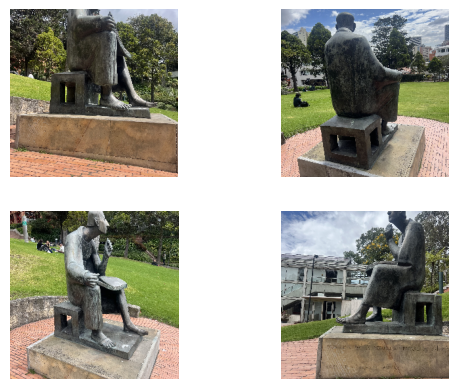

In [29]:
bobo_raw_folder = "bobo_raw_images/"
display_some_frames(bobo_raw_folder)

## Matriz instrínseca y extrínseca de la cámara
![image.jpg](markdown_assests/pinholeCamera.png)

En la calibración de cámaras, se utilizan parámetros intrínsecos y extrínsecos para describir cómo una cámara captura la escena en 3D y la proyecta en una imagen 2D. Los **parámetros intrínsecos** son específicos de cada cámara y definen su comportamiento interno. Incluyen el punto principal (donde el eje óptico de la cámara intersecta el plano de la imagen), la distancia focal (que determina el nivel de zoom de la cámara) y los factores de escala de los ejes \(x\) e \(y\) en el plano de la imagen. Estos parámetros permiten transformar las coordenadas de la cámara en coordenadas de píxeles, como se ilustra en la imagen, donde el plano de la imagen se encuentra antes del plano focal. Los parámetros intrínsecos encapsulan toda esta información, incluyendo posibles distorsiones ópticas, para corregir la imagen capturada y representar adecuadamente las proporciones de la escena.

Por otro lado, los **parámetros extrínsecos** describen la posición y orientación de la cámara con respecto a un marco de referencia global, conocido como *world frame*. Estos parámetros consisten en una matriz de rotación y un vector de traslación que permiten transformar las coordenadas de un punto en el mundo a las coordenadas de la cámara. Como se muestra en la imagen, el sistema de coordenadas del *world frame* se transforma al *camera frame* mediante los parámetros extrínsecos, y luego las coordenadas se proyectan al plano de la imagen usando los parámetros intrínsecos. Esta separación entre intrínsecas y extrínsecas es fundamental para tareas de visión por computadora, como la reconstrucción 3D, la realidad aumentada y la fotogrametría, donde es crucial entender no solo cómo una cámara ve el mundo, sino también desde dónde lo ve.

## Extránseca multicámara y COLMAP
![image.jpg](markdown_assests/multicameracalib.jpg)

La extrínseca multicámara se refiere a la matriz de transformación que define la posición y orientación de cada cámara en un sistema multicámara con respecto a un marco de referencia global o respecto a otra cámara del sistema. En otras palabras, las matrices extrínsecas describen cómo están posicionadas y orientadas las cámaras entre sí dentro del entorno 3D. En la imagen proporcionada, se puede observar cómo varias cámaras (P1, P2, P3) capturan diferentes vistas del mismo punto 3D X_j en el espacio, generando las proyecciones 2D correspondientes (x1j, x2j, x3j) en sus planos de imagen. La calibración extrínseca multicámara es crucial para reconstruir la posición precisa del punto 3D en un espacio común, ya que se necesita conocer cómo se relacionan espacialmente las cámaras entre sí para combinar sus datos y crear una representación coherente de la escena.

COLMAP es una herramienta de fotogrametría y reconstrucción 3D que utiliza estas matrices extrínsecas, junto con las intrínsecas de cada cámara, para alinear y fusionar las imágenes capturadas desde diferentes perspectivas. En el proceso de calibración, COLMAP estima las matrices extrínsecas resolviendo un problema de optimización que minimiza la diferencia entre las proyecciones 2D observadas (x1j, x2j, x3j) y las proyecciones esperadas calculadas a partir del modelo 3D reconstruido. De esta forma, la relación extrínseca multicámara que establece COLMAP permite una reconstrucción precisa de la estructura de la escena y la ubicación de cada cámara, facilitando aplicaciones como la creación de mapas 3D, la realidad aumentada y la cinematografía digital.

## Preprocesamiento de las imágenes

En la siguiente celda, declararemos el comando de nerfstudio para procesar las imágenes en la carpeta "bobo_raw_images/" con el fin de usar colmap y generar los datos en el formato correcto de narfstudio-data en un directorio de salida llamado "data/nerfstudio/bobo".

Con el objetivo de evitar errores y mantener la estabilidad del laboratorio, los datos de salida de COLMAP se encuentran comprimidos en data_bobo.zip, por lo tanto, en la siguiente celda:

    1. Declara la variable nerfstudio_bobo_colmap_processing_command con el string correspondiente al comando que procesa los datos del bobo segun nerfstudio que usa COLMAP por debajo
    
    2. Ejecuta el comando en bash/shell para descomprimir data_bobo.zip, ¡utiliza la opcion -o de unzip para sobreescribir cualquier dato ya descomprimido y evitar problemas con el evaluador automático!

**Nota importante**:
Para correr comando de bash/shell en un notebook .ipynb, escribe la linea precedida por un sigo de exclamacion "!" por ejemplo, para listar la carpeta en la que te encuentras, corre: !ls

In [30]:
nerfstudio_bobo_colmap_processing_command = "!ns-process-data images --data bobo_raw_images/ --output-dir data/nerfstudio/bobo"
!unzip -o data_bobo.zip

Archive:  data_bobo.zip
   creating: data/nerfstudio/bobo/
  inflating: data/nerfstudio/bobo/sparse_pc.ply  
  inflating: data/nerfstudio/bobo/transforms.json  
   creating: data/nerfstudio/bobo/images/
  inflating: data/nerfstudio/bobo/images/frame_00001.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00002.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00003.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00004.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00005.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00006.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00007.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00008.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00009.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00010.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00011.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00012.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00013.jpg  
  inflating: data/nerfstudio/b

  inflating: data/nerfstudio/bobo/images/frame_00136.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00137.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00138.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00139.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00140.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00141.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00142.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00143.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00144.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00145.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00146.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00147.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00148.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00149.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00150.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00151.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00152.jpg

  inflating: data/nerfstudio/bobo/images/frame_00274.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00275.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00276.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00277.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00278.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00279.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00280.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00281.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00282.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00283.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00284.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00285.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00286.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00287.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00288.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00289.jpg  
  inflating: data/nerfstudio/bobo/images/frame_00290.jpg

  inflating: data/nerfstudio/bobo/images_2/frame_00085.jpg  
  inflating: data/nerfstudio/bobo/images_2/frame_00086.jpg  
  inflating: data/nerfstudio/bobo/images_2/frame_00087.jpg  
  inflating: data/nerfstudio/bobo/images_2/frame_00088.jpg  
  inflating: data/nerfstudio/bobo/images_2/frame_00089.jpg  
  inflating: data/nerfstudio/bobo/images_2/frame_00090.jpg  
  inflating: data/nerfstudio/bobo/images_2/frame_00091.jpg  
  inflating: data/nerfstudio/bobo/images_2/frame_00092.jpg  
  inflating: data/nerfstudio/bobo/images_2/frame_00093.jpg  
  inflating: data/nerfstudio/bobo/images_2/frame_00094.jpg  
  inflating: data/nerfstudio/bobo/images_2/frame_00095.jpg  
  inflating: data/nerfstudio/bobo/images_2/frame_00096.jpg  
  inflating: data/nerfstudio/bobo/images_2/frame_00097.jpg  
  inflating: data/nerfstudio/bobo/images_2/frame_00098.jpg  
  inflating: data/nerfstudio/bobo/images_2/frame_00099.jpg  
  inflating: data/nerfstudio/bobo/images_2/frame_00100.jpg  
  inflating: data/nerfst

  inflating: data/nerfstudio/bobo/images_2/frame_00219.jpg  
  inflating: data/nerfstudio/bobo/images_2/frame_00220.jpg  
  inflating: data/nerfstudio/bobo/images_2/frame_00221.jpg  
  inflating: data/nerfstudio/bobo/images_2/frame_00222.jpg  
  inflating: data/nerfstudio/bobo/images_2/frame_00223.jpg  
  inflating: data/nerfstudio/bobo/images_2/frame_00224.jpg  
  inflating: data/nerfstudio/bobo/images_2/frame_00225.jpg  
  inflating: data/nerfstudio/bobo/images_2/frame_00226.jpg  
  inflating: data/nerfstudio/bobo/images_2/frame_00227.jpg  
  inflating: data/nerfstudio/bobo/images_2/frame_00228.jpg  
  inflating: data/nerfstudio/bobo/images_2/frame_00229.jpg  
  inflating: data/nerfstudio/bobo/images_2/frame_00230.jpg  
  inflating: data/nerfstudio/bobo/images_2/frame_00231.jpg  
  inflating: data/nerfstudio/bobo/images_2/frame_00232.jpg  
  inflating: data/nerfstudio/bobo/images_2/frame_00233.jpg  
  inflating: data/nerfstudio/bobo/images_2/frame_00234.jpg  
  inflating: data/nerfst

  inflating: data/nerfstudio/bobo/images_4/frame_00028.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00029.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00030.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00031.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00032.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00033.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00034.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00035.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00036.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00037.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00038.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00039.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00040.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00041.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00042.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00043.jpg  
  inflating: data/nerfst

  inflating: data/nerfstudio/bobo/images_4/frame_00162.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00163.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00164.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00165.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00166.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00167.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00168.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00169.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00170.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00171.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00172.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00173.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00174.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00175.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00176.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00177.jpg  
  inflating: data/nerfst

  inflating: data/nerfstudio/bobo/images_4/frame_00297.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00298.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00299.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00300.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00301.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00302.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00303.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00304.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00305.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00306.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00307.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00308.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00309.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00310.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00311.jpg  
  inflating: data/nerfstudio/bobo/images_4/frame_00312.jpg  
  inflating: data/nerfst

  inflating: data/nerfstudio/bobo/images_8/frame_00107.jpg  
  inflating: data/nerfstudio/bobo/images_8/frame_00108.jpg  
  inflating: data/nerfstudio/bobo/images_8/frame_00109.jpg  
  inflating: data/nerfstudio/bobo/images_8/frame_00110.jpg  
  inflating: data/nerfstudio/bobo/images_8/frame_00111.jpg  
  inflating: data/nerfstudio/bobo/images_8/frame_00112.jpg  
  inflating: data/nerfstudio/bobo/images_8/frame_00113.jpg  
  inflating: data/nerfstudio/bobo/images_8/frame_00114.jpg  
  inflating: data/nerfstudio/bobo/images_8/frame_00115.jpg  
  inflating: data/nerfstudio/bobo/images_8/frame_00116.jpg  
  inflating: data/nerfstudio/bobo/images_8/frame_00117.jpg  
  inflating: data/nerfstudio/bobo/images_8/frame_00118.jpg  
  inflating: data/nerfstudio/bobo/images_8/frame_00119.jpg  
  inflating: data/nerfstudio/bobo/images_8/frame_00120.jpg  
  inflating: data/nerfstudio/bobo/images_8/frame_00121.jpg  
  inflating: data/nerfstudio/bobo/images_8/frame_00122.jpg  
  inflating: data/nerfst

  inflating: data/nerfstudio/bobo/images_8/frame_00242.jpg  
  inflating: data/nerfstudio/bobo/images_8/frame_00243.jpg  
  inflating: data/nerfstudio/bobo/images_8/frame_00244.jpg  
  inflating: data/nerfstudio/bobo/images_8/frame_00245.jpg  
  inflating: data/nerfstudio/bobo/images_8/frame_00246.jpg  
  inflating: data/nerfstudio/bobo/images_8/frame_00247.jpg  
  inflating: data/nerfstudio/bobo/images_8/frame_00248.jpg  
  inflating: data/nerfstudio/bobo/images_8/frame_00249.jpg  
  inflating: data/nerfstudio/bobo/images_8/frame_00250.jpg  
  inflating: data/nerfstudio/bobo/images_8/frame_00251.jpg  
  inflating: data/nerfstudio/bobo/images_8/frame_00252.jpg  
  inflating: data/nerfstudio/bobo/images_8/frame_00253.jpg  
  inflating: data/nerfstudio/bobo/images_8/frame_00254.jpg  
  inflating: data/nerfstudio/bobo/images_8/frame_00255.jpg  
  inflating: data/nerfstudio/bobo/images_8/frame_00256.jpg  
  inflating: data/nerfstudio/bobo/images_8/frame_00257.jpg  
  inflating: data/nerfst

### Verifica y guarda tu respuesta 4

In [31]:
assert(os.path.isdir("data/nerfstudio/bobo")), 'Error al descomprimir los datos'
assert('!ns' in nerfstudio_bobo_colmap_processing_command), 'Error en la declaración del comando'
lm.verify_and_save(4, nerfstudio_bobo_colmap_processing_command, codigo)

## Entrenando el modelo base personalizado

Similar a la primera parte de este laboratorio, entrena ahora un modelo nerfacto sobre las imagene del bobo. Llamaremos este experimento "bobo" y usaremos **los mismos** parametros que en el caso del poster

In [32]:
#Agrega el comando de bash/shell de entrenamiento del modelo personalizado
!ns-train nerfacto --experiment-name bobo --max-num-iterations 2000 --vis tensorboard --viewer.websocket-port 7007 nerfstudio-data --data data/nerfstudio/bobo --downscale-factor 8

──────────────────────────────────────────────────────── Config ────────────────────────────────────────────────────────
TrainerConfig(
    _target=<class 'nerfstudio.engine.trainer.Trainer'>,
    output_dir=PosixPath('outputs'),
    method_name='nerfacto',
    experiment_name='bobo',
    project_name='nerfstudio-project',
    timestamp='2026-04-12_145844',
    machine=MachineConfig(seed=42, num_devices=1, num_machines=1, machine_rank=0, dist_url='auto', device_type='cuda'),
    logging=LoggingConfig(
        relative_log_dir=PosixPath('.'),
        steps_per_log=10,
        max_buffer_size=20,
        local_writer=LocalWriterConfig(
            _target=<class 'nerfstudio.utils.writer.LocalWriter'>,
            enable=True,
            stats_to_track=(
                <EventName.ITER_TRAIN_TIME: 'Train Iter (time)'>,
                <EventName.TRAIN_RAYS_PER_SEC: 'Train Rays / Sec'>,
                <EventName.CURR_TEST_PSNR: 'Test PSNR'>,
                <EventName.VIS_RAYS_PER_SEC: '

           Saving checkpoints to: outputs/bobo/nerfacto/2026-04-12_145844/nerfstudio_models               ]8;id=234053;file:///root/miniconda3/envs/py310/lib/python3.10/site-packages/nerfstudio/engine/trainer.py\trainer.py]8;;\:]8;id=146316;file:///root/miniconda3/envs/py310/lib/python3.10/site-packages/nerfstudio/engine/trainer.py#142\142]8;;\
Started threads
Setting up evaluation dataset...
Caching all 32 images.
Loading data batch ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 0:00:00
Loading data batch ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 0:00:01m 0:00:01
No Nerfstudio checkpoint to load, so training from scratch.
logging events to: outputs/bobo/nerfacto/2026-04-12_145844
[14:58:55] Printing max of 10 lines. Set flag --logging.local-writer.max-log-size=0 to disable line        ]8;id=846335;file:///root/miniconda3/envs/py310/lib/python3.10/site-packages/nerfstudio/utils/writer.py\writer.py]8;;\:]8;id=45561;file:///root/miniconda3/envs/py310/lib/python3.10/site-p

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec      
----------------------------------------------------------------------------------- 
10 (0.50%)          282.218 ms           9 m, 21 s            18.41 K               
20 (1.00%)          227.830 ms           7 m, 31 s            20.65 K               
30 (1.50%)          225.924 ms           7 m, 25 s            27.35 K               
40 (2.00%)          240.876 ms           7 m, 52 s            25.42 K               
50 (2.50%)          239.498 ms           7 m, 47 s            21.19 K               
60 (3.00%)          217.317 ms           7 m, 1 s             22.67 K               
70 (3.50%)          235.206 ms           7 m, 33 s            19.54 K               
80 (4.00%)          232.528 ms           7 m, 26 s            19.42 K               
90 (4.50%)          218.684 ms           6 m, 57 s            21.27 K               
100 (5.00%)         238.842 ms           7 m, 33 s            21.

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec      
----------------------------------------------------------------------------------- 
90 (4.50%)          218.684 ms           6 m, 57 s            21.27 K               
100 (5.00%)         238.842 ms           7 m, 33 s            21.58 K               
110 (5.50%)         241.190 ms           7 m, 35 s            22.22 K               
120 (6.00%)         220.496 ms           6 m, 54 s            21.81 K               
130 (6.50%)         228.786 ms           7 m, 7 s             19.81 K               
140 (7.00%)         259.147 ms           8 m, 2 s             17.00 K               
150 (7.50%)         240.952 ms           7 m, 25 s            26.31 K               
160 (8.00%)         210.027 ms           6 m, 26 s            30.08 K               
170 (8.50%)         229.543 ms           7 m, 0 s             21.80 K               
180 (9.00%)         256.486 ms           7 m, 46 s            18.

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec      
----------------------------------------------------------------------------------- 
170 (8.50%)         229.543 ms           7 m, 0 s             21.80 K               
180 (9.00%)         256.486 ms           7 m, 46 s            18.59 K               
190 (9.50%)         238.516 ms           7 m, 11 s            19.26 K               
200 (10.00%)        221.048 ms           6 m, 37 s            20.48 K               
210 (10.50%)        218.704 ms           6 m, 31 s            20.86 K               
220 (11.00%)        203.701 ms           6 m, 2 s             22.79 K               
230 (11.50%)        208.263 ms           6 m, 8 s             22.25 K               
240 (12.00%)        210.018 ms           6 m, 9 s             22.95 K               
250 (12.50%)        216.550 ms           6 m, 18 s            22.40 K               
260 (13.00%)        217.563 ms           6 m, 18 s            26.

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec      
----------------------------------------------------------------------------------- 
250 (12.50%)        216.550 ms           6 m, 18 s            22.40 K               
260 (13.00%)        217.563 ms           6 m, 18 s            26.60 K               
270 (13.50%)        202.085 ms           5 m, 49 s            29.08 K               
280 (14.00%)        214.438 ms           6 m, 8 s             22.18 K               
290 (14.50%)        240.505 ms           6 m, 51 s            18.28 K               
300 (15.00%)        234.638 ms           6 m, 38 s            19.39 K               
310 (15.50%)        210.197 ms           5 m, 55 s            22.12 K               
320 (16.00%)        209.576 ms           5 m, 52 s            24.39 K               
330 (16.50%)        208.079 ms           5 m, 47 s            30.39 K               
340 (17.00%)        212.617 ms           5 m, 52 s            27.

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec      
----------------------------------------------------------------------------------- 
330 (16.50%)        208.079 ms           5 m, 47 s            30.39 K               
340 (17.00%)        212.617 ms           5 m, 52 s            27.91 K               
350 (17.50%)        224.559 ms           6 m, 10 s            20.73 K               
360 (18.00%)        222.765 ms           6 m, 5 s             20.26 K               
370 (18.50%)        203.646 ms           5 m, 31 s            22.34 K               
380 (19.00%)        192.770 ms           5 m, 12 s            23.91 K               
390 (19.50%)        217.624 ms           5 m, 50 s            20.76 K               
400 (20.00%)        234.485 ms           6 m, 15 s            25.14 K               
410 (20.50%)        227.971 ms           6 m, 2 s             31.02 K               
420 (21.00%)        227.591 ms           5 m, 59 s            26.

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
410 (20.50%)        227.971 ms           6 m, 2 s             31.02 K                                    
420 (21.00%)        227.591 ms           5 m, 59 s            26.90 K                                    
430 (21.50%)        242.073 ms           6 m, 20 s            20.40 K                                    
440 (22.00%)        233.826 ms           6 m, 4 s             18.21 K                                    
450 (22.50%)        210.282 ms           5 m, 25 s            21.51 K                                    
460 (23.00%)        194.093 ms           4 m, 58 s            24.01 K                                    
470 (23.50%)        191.773 ms           4 m, 53 s            23.65 K                                    
480 (24.00%)        195.483 ms           4 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
480 (24.00%)        195.483 ms           4 m, 57 s            29.20 K                                    
490 (24.50%)        192.714 ms           4 m, 50 s            29.43 K                                    
500 (25.00%)        190.159 ms           4 m, 45 s            24.53 K              221.96 K              
510 (25.50%)        207.949 ms           5 m, 9 s             22.28 K                                    
520 (26.00%)        214.559 ms           5 m, 17 s            20.35 K                                    
530 (26.50%)        203.440 ms           4 m, 59 s            23.61 K                                    
540 (27.00%)        200.962 ms           4 m, 53 s            23.60 K                                    
550 (27.50%)        218.267 ms           5 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
550 (27.50%)        218.267 ms           5 m, 16 s            20.48 K                                    
560 (28.00%)        217.285 ms           5 m, 12 s            20.16 K                                    
570 (28.50%)        206.524 ms           4 m, 55 s            20.90 K                                    
580 (29.00%)        215.165 ms           5 m, 5 s             20.31 K                                    
590 (29.50%)        209.353 ms           4 m, 55 s            21.63 K                                    
600 (30.00%)        223.820 ms           5 m, 13 s            21.25 K                                    
610 (30.50%)        217.121 ms           5 m, 1 s             21.70 K                                    
620 (31.00%)        196.981 ms           4 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
620 (31.00%)        196.981 ms           4 m, 31 s            23.25 K                                    
630 (31.50%)        208.058 ms           4 m, 45 s            22.16 K                                    
640 (32.00%)        205.198 ms           4 m, 39 s            22.38 K                                    
650 (32.50%)        205.462 ms           4 m, 37 s            23.09 K                                    
660 (33.00%)        224.943 ms           5 m, 1 s             21.85 K                                    
670 (33.50%)        228.948 ms           5 m, 4 s             20.32 K                                    
680 (34.00%)        204.143 ms           4 m, 29 s            27.50 K                                    
690 (34.50%)        196.110 ms           4 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
690 (34.50%)        196.110 ms           4 m, 16 s            28.57 K                                    
700 (35.00%)        200.194 ms           4 m, 20 s            24.60 K                                    
710 (35.50%)        205.242 ms           4 m, 24 s            23.35 K                                    
720 (36.00%)        212.372 ms           4 m, 31 s            23.53 K                                    
730 (36.50%)        200.075 ms           4 m, 14 s            25.99 K                                    
740 (37.00%)        185.065 ms           3 m, 53 s            27.40 K                                    
750 (37.50%)        174.597 ms           3 m, 38 s            32.94 K                                    
760 (38.00%)        211.659 ms           4 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
760 (38.00%)        211.659 ms           4 m, 22 s            30.48 K                                    
770 (38.50%)        234.935 ms           4 m, 48 s            29.79 K                                    
780 (39.00%)        231.132 ms           4 m, 41 s            26.26 K                                    
790 (39.50%)        228.322 ms           4 m, 36 s            21.67 K                                    
800 (40.00%)        197.990 ms           3 m, 57 s            26.53 K                                    
810 (40.50%)        188.243 ms           3 m, 44 s            24.94 K                                    
820 (41.00%)        212.470 ms           4 m, 10 s            20.80 K                                    
830 (41.50%)        227.338 ms           4 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
830 (41.50%)        227.338 ms           4 m, 25 s            19.13 K                                    
840 (42.00%)        222.236 ms           4 m, 17 s            19.73 K                                    
850 (42.50%)        212.378 ms           4 m, 4 s             20.99 K                                    
860 (43.00%)        204.142 ms           3 m, 52 s            23.88 K                                    
870 (43.50%)        217.467 ms           4 m, 5 s             24.03 K                                    
880 (44.00%)        228.688 ms           4 m, 16 s            21.45 K                                    
890 (44.50%)        215.616 ms           3 m, 59 s            23.52 K                                    
900 (45.00%)        200.074 ms           3 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
900 (45.00%)        200.074 ms           3 m, 40 s            24.89 K                                    
910 (45.50%)        193.334 ms           3 m, 30 s            23.85 K                                    
920 (46.00%)        217.910 ms           3 m, 55 s            21.79 K                                    
930 (46.50%)        231.234 ms           4 m, 7 s             21.58 K                                    
940 (47.00%)        207.967 ms           3 m, 40 s            23.52 K                                    
950 (47.50%)        197.955 ms           3 m, 27 s            24.67 K                                    
960 (48.00%)        200.884 ms           3 m, 28 s            28.05 K                                    
970 (48.50%)        209.033 ms           3 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
970 (48.50%)        209.033 ms           3 m, 35 s            28.27 K                                    
980 (49.00%)        208.263 ms           3 m, 32 s            25.84 K                                    
990 (49.50%)        196.604 ms           3 m, 18 s            27.90 K                                    
1000 (50.00%)       199.032 ms           3 m, 19 s            28.28 K              308.09 K              
1010 (50.50%)       212.295 ms           3 m, 30 s            23.02 K                                    
1020 (51.00%)       213.903 ms           3 m, 29 s            20.67 K                                    
1030 (51.50%)       235.738 ms           3 m, 48 s            18.93 K                                    
1040 (52.00%)       249.119 ms           3 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
1040 (52.00%)       249.119 ms           3 m, 59 s            17.91 K                                    
1050 (52.50%)       244.863 ms           3 m, 52 s            18.32 K                                    
1060 (53.00%)       241.438 ms           3 m, 46 s            19.43 K                                    
1070 (53.50%)       227.117 ms           3 m, 31 s            21.88 K                                    
1080 (54.00%)       217.279 ms           3 m, 19 s            21.83 K                                    
1090 (54.50%)       213.297 ms           3 m, 14 s            20.63 K                                    
1100 (55.00%)       188.931 ms           2 m, 50 s            24.31 K                                    
1110 (55.50%)       176.274 ms           2 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
1110 (55.50%)       176.274 ms           2 m, 36 s            30.03 K                                    
1120 (56.00%)       197.965 ms           2 m, 54 s            27.23 K                                    
1130 (56.50%)       211.282 ms           3 m, 3 s             23.25 K                                    
1140 (57.00%)       207.658 ms           2 m, 58 s            24.42 K                                    
1150 (57.50%)       219.000 ms           3 m, 6 s             24.62 K                                    
1160 (58.00%)       219.793 ms           3 m, 4 s             25.30 K                                    
1170 (58.50%)       213.502 ms           2 m, 57 s            23.57 K                                    
1180 (59.00%)       222.480 ms           3 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
1180 (59.00%)       222.480 ms           3 m, 2 s             21.35 K                                    
1190 (59.50%)       242.031 ms           3 m, 16 s            19.90 K                                    
1200 (60.00%)       252.045 ms           3 m, 21 s            18.20 K                                    
1210 (60.50%)       251.927 ms           3 m, 19 s            18.51 K                                    
1220 (61.00%)       256.190 ms           3 m, 19 s            19.60 K                                    
1230 (61.50%)       245.317 ms           3 m, 8 s             19.57 K                                    
1240 (62.00%)       231.696 ms           2 m, 56 s            18.99 K                                    
1250 (62.50%)       210.481 ms           2 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
1250 (62.50%)       210.481 ms           2 m, 37 s            21.65 K                                    
1260 (63.00%)       202.946 ms           2 m, 30 s            22.59 K                                    
1270 (63.50%)       204.025 ms           2 m, 28 s            23.95 K                                    
1280 (64.00%)       204.799 ms           2 m, 27 s            24.45 K                                    
1290 (64.50%)       195.969 ms           2 m, 19 s            25.33 K                                    
1300 (65.00%)       201.042 ms           2 m, 20 s            27.58 K                                    
1310 (65.50%)       207.993 ms           2 m, 23 s            25.28 K                                    
1320 (66.00%)       201.895 ms           2 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
1320 (66.00%)       201.895 ms           2 m, 17 s            24.09 K                                    
1330 (66.50%)       214.897 ms           2 m, 23 s            23.20 K                                    
1340 (67.00%)       217.215 ms           2 m, 23 s            21.77 K                                    
1350 (67.50%)       199.743 ms           2 m, 9 s             23.37 K                                    
1360 (68.00%)       185.149 ms           1 m, 58 s            24.62 K                                    
1370 (68.50%)       188.964 ms           1 m, 59 s            24.09 K                                    
1380 (69.00%)       212.282 ms           2 m, 11 s            22.44 K                                    
1390 (69.50%)       234.727 ms           2 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
1390 (69.50%)       234.727 ms           2 m, 23 s            21.19 K                                    
1400 (70.00%)       243.780 ms           2 m, 26 s            20.27 K                                    
1410 (70.50%)       238.385 ms           2 m, 20 s            20.36 K                                    
1420 (71.00%)       224.446 ms           2 m, 10 s            21.45 K                                    
1430 (71.50%)       214.679 ms           2 m, 2 s             21.43 K                                    
1440 (72.00%)       225.000 ms           2 m, 5 s             20.45 K                                    
1450 (72.50%)       243.163 ms           2 m, 13 s            18.56 K                                    
1460 (73.00%)       248.066 ms           2 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
1460 (73.00%)       248.066 ms           2 m, 13 s            17.18 K                                    
1470 (73.50%)       234.361 ms           2 m, 4 s             18.87 K                                    
1480 (74.00%)       208.239 ms           1 m, 48 s            21.66 K                                    
1490 (74.50%)       191.637 ms           1 m, 37 s            26.08 K                                    
1500 (75.00%)       178.717 ms           1 m, 29 s            34.37 K              339.76 K              
1510 (75.50%)       203.836 ms           1 m, 39 s            29.43 K                                    
1520 (76.00%)       224.178 ms           1 m, 47 s            20.48 K                                    
1530 (76.50%)       204.064 ms           1 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
1530 (76.50%)       204.064 ms           1 m, 35 s            25.47 K                                    
1540 (77.00%)       215.531 ms           1 m, 39 s            25.59 K                                    
1550 (77.50%)       247.897 ms           1 m, 51 s            20.06 K                                    
1560 (78.00%)       249.989 ms           1 m, 49 s            18.88 K                                    
1570 (78.50%)       209.467 ms           1 m, 30 s            28.21 K                                    
1580 (79.00%)       194.652 ms           1 m, 21 s            30.48 K                                    
1590 (79.50%)       197.746 ms           1 m, 21 s            30.10 K                                    
1600 (80.00%)       192.546 ms           1 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
1600 (80.00%)       192.546 ms           1 m, 17 s            35.42 K                                    
1610 (80.50%)       197.142 ms           1 m, 16 s            28.66 K                                    
1620 (81.00%)       197.051 ms           1 m, 14 s            23.38 K                                    
1630 (81.50%)       184.956 ms           1 m, 8 s             24.43 K                                    
1640 (82.00%)       192.631 ms           1 m, 9 s             23.56 K                                    
1650 (82.50%)       209.782 ms           1 m, 13 s            23.83 K                                    
1660 (83.00%)       206.435 ms           1 m, 10 s            24.09 K                                    
1670 (83.50%)       205.092 ms           1 m, 

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
1670 (83.50%)       205.092 ms           1 m, 7 s             22.49 K                                    
1680 (84.00%)       212.424 ms           1 m, 7 s             28.81 K                                    
1690 (84.50%)       215.699 ms           1 m, 6 s             27.60 K                                    
1700 (85.00%)       207.646 ms           1 m, 2 s             21.80 K                                    
1710 (85.50%)       209.809 ms           1 m, 0 s             22.93 K                                    
1720 (86.00%)       213.815 ms           59 s, 868.289 ms     21.60 K                                    
1730 (86.50%)       203.722 ms           55 s, 5.008 ms       23.27 K                                    
1740 (87.00%)       193.419 ms           50 s,

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
1740 (87.00%)       193.419 ms           50 s, 288.907 ms     27.82 K                                    
1750 (87.50%)       204.718 ms           51 s, 179.516 ms     24.81 K                                    
1760 (88.00%)       227.070 ms           54 s, 496.734 ms     21.28 K                                    
1770 (88.50%)       230.502 ms           53 s, 15.374 ms      21.75 K                                    
1780 (89.00%)       211.035 ms           46 s, 427.632 ms     23.30 K                                    
1790 (89.50%)       200.367 ms           42 s, 77.087 ms      25.38 K                                    
1800 (90.00%)       193.676 ms           38 s, 735.204 ms     26.62 K                                    
1810 (90.50%)       195.049 ms           37 s,

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
1810 (90.50%)       195.049 ms           37 s, 59.294 ms      24.97 K                                    
1820 (91.00%)       243.557 ms           43 s, 840.236 ms     18.07 K                                    
1830 (91.50%)       240.593 ms           40 s, 900.819 ms     18.92 K                                    
1840 (92.00%)       210.091 ms           33 s, 614.538 ms     21.28 K                                    
1850 (92.50%)       218.613 ms           32 s, 791.972 ms     19.53 K                                    
1860 (93.00%)       233.292 ms           32 s, 660.814 ms     18.41 K                                    
1870 (93.50%)       227.215 ms           29 s, 537.893 ms     21.39 K                                    
1880 (94.00%)       215.980 ms           25 s,

Step (% Done)       Train Iter (time)    ETA (time)           Train Rays / Sec     Test Rays / Sec       
-------------------------------------------------------------------------------------------------------- 
1880 (94.00%)       215.980 ms           25 s, 917.635 ms     22.60 K                                    
1890 (94.50%)       242.984 ms           26 s, 728.187 ms     18.27 K                                    
1900 (95.00%)       255.395 ms           25 s, 539.470 ms     17.32 K                                    
1910 (95.50%)       240.857 ms           21 s, 677.135 ms     18.34 K                                    
1920 (96.00%)       229.009 ms           18 s, 320.701 ms     19.99 K                                    
1930 (96.50%)       208.385 ms           14 s, 586.952 ms     22.81 K                                    
1940 (97.00%)       192.501 ms           11 s, 550.076 ms     24.60 K                                    
1950 (97.50%)       201.741 ms           10 s,

### Verifica y guarda tu respuesta 5

In [33]:
base_dir = 'outputs/bobo/nerfacto'
assert os.path.isdir(base_dir), 'Errores en el comando de entrenamiento'
lm.verify_and_save(5, None, codigo)

## Extracción de geometría (mallas)

En general, extraer una malla significa obtener una representación estructurada de una superficie 3D a partir de datos discretos, como una nube de puntos o un conjunto de imágenes. Una malla está compuesta por vértices, aristas y caras que definen la forma y la estructura de un objeto tridimensional. Estas mallas permiten representar la geometría de objetos complejos de manera eficiente y son fundamentales en aplicaciones como la realidad virtual, la animación y la ingeniería. En el espacio 3D, las mallas pueden describirse mediante diferentes representaciones, como polígonos (generalmente triángulos) que se conectan entre sí para formar superficies continuas, proporcionando una manera precisa de capturar los contornos y detalles de un objeto.

![image.jpg](markdown_assests/bunny_mesh.png)

La extracción de una malla desde un campo de radiancia, como en un modelo NeRF (Neural Radiance Field), implica reconstruir la geometría implícita de la escena que ha sido capturada a través de imágenes 2D. Un método común para realizar esta extracción es "Marching Cubes", el cual discretiza el espacio en una cuadrícula 3D y construye la malla identificando los contornos del campo de radiancia que superan un determinado umbral de densidad. Poisson Surface Reconstruction, en cambio, utiliza un enfoque basado en la teoría de campos vectoriales para producir superficies suaves y detalladas a partir de la nube de puntos, lo que puede ser más adecuado para escenas complejas con detalles finos. En ambos casos, el objetivo es traducir la información volumétrica contenida en el campo de radiancia en una superficie clara y definida que pueda ser manipulada y visualizada como una malla 3D.

![image.jpg](markdown_assests/PoissonRecon.jpeg)

Los archivos .ply y .obj son formatos estándar para almacenar y compartir datos de geometría 3D. El formato .ply (Polygon File Format) puede contener tanto nubes de puntos como mallas poligonales y permite almacenar información adicional, como colores o normales de superficie, para cada vértice. Por otro lado, el formato .obj es ampliamente utilizado para describir mallas tridimensionales, detallando las coordenadas de los vértices, las caras y, opcionalmente, las texturas y normales. Estos archivos pueden visualizarse y manipularse en diversas aplicaciones de software 3D, como Blender, MeshLab o herramientas de desarrollo como Pythreejs y Trimesh en Python, lo que facilita la inspección y uso de los datos 3D en diferentes contextos, desde la investigación hasta la producción en industrias creativas y de ingeniería.

In [34]:
most_recent_dir = get_most_recent_directory(base_dir)
config_path = os.path.join(most_recent_dir, 'config.yml')

En la siguiente celda, usa la funcion de extraccion poisson para extraer la malla de la escultura "bobo".

Este comando:

1. Debe usar la configuracion del modelo que entrenaste 
2. Establece que la salida se encuentre dentro de la carpeta "exports/mesh/bobo/" 
3. Define 50000 caras objetivo para la malla, 2048 pixeles por lado para el material 
4. Define 100000 puntos para la nube de punto 
5. activa removida de valores atipicos (outliers) 
6. extrae las normales usando open3d 
7. Establece el vector nulo en el centro y rotacion del cuadro delimitador (bounding box)
8. Poner una escala de 1.0 en el cuadro delimitador (bounding box) para los tres valores del vector scale (esto para que se corte todo el contenido del campo de radiancia lejos de la escultura)

Pista 1: la [documentacion de exportacion de geometria de NeRFstudio](https://docs.nerf.studio/quickstart/export_geometry.html)

Pista 2: La opcion -h del comando de exportacion puede ser de ayuda

Pista 3: Recuerda usar el archivo de configuración (config_path) dentro del comando

In [38]:

#Agrega el comando de bash/shell de exportación de la malla usando nerfstudio
!ns-export poisson \
    --load-config $config_filename \
    --output-dir exports/mesh/bobo/ \
    --target-num-faces 50000 \
    --num-pixels-per-side 2048 \
    --num-points 100000 \
    --remove-outliers True \
    --normal-method open3d \
    --obb-center 0.0 0.0 0.0 \
    --obb-rotation 0.0 0.0 0.0 \
    --obb-scale 1.0 1.0 1.0

Started threads
Setting up evaluation dataset...
Caching all 22 images.
Loading data batch ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 0:00:00
Loading data batch ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 0:00:00m 0:00:01
Loading latest checkpoint from load_dir
✅ Done loading checkpoint from outputs/poster/nerfacto/2026-04-12_142353/nerfstudio_models/step-000001999.ckpt
☁ Computing Point Cloud ☁ ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 00:2800:0100:01
Cleaning Point Cloud

✅ Cleaning Point Cloud
Estimating Point Cloud Normals

✅ Estimating Point Cloud Normals
✅ Generated PointCloud with 100305 points.
Computing Mesh... this may take a while.

✅ Computing Mesh
Saving Mesh...

✅ Saving Mesh
Running meshing decimation with quadric edge collapse
Texturing mesh with NeRF
Unwrapping mesh with xatlas method... this may take a while.
Chunking faces for rasterization ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 03:4900:0100:07

✅ Unwrapped mesh with xatlas method
Creating texture image b

### Verifica y guarda tu respuesta 6

In [39]:
assert os.path.isfile('exports/mesh/bobo/mesh.obj'), 'Errores en el comando de exportación de la malla'
lm.verify_and_save(6, None, codigo)

## Visualización de la malla extraída

En caso de poder disponer de programas que les permita visualizar archivos .obj se les recomienda usarlos para observar con colores y radiancias la malla tridimensional que fue extraida durante el entrenamiento. En caso que no tengan la posibilidad, no se preocupen, en el siguiente link encuentran un [visualizador 3D online](https://3dviewer.net/) para que carguen la malla generada por ustedes en exports/mesh/bobo/mesh.obj

![image.jpg](markdown_assests/3DBobo.png)

## Para finalizar el laboratorio: Guarda todas tus respuestas!

Verifica todas tus respuestas y termina con el proceso de guardado del laboratorio corriendo la siguiente celda. Una vez hecho esto, ve a la ventana de envío del laboratorio para enviar tus respuestas y recibir retroalimentación inmediata via email. 

In [40]:
lm.save_answers(codigo)